In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as ss
import plotly.graph_objects as go
import plotly.express as px
from matplotlib.pyplot import figure
import random
import seaborn as sns
np.random.seed(1126)
random.seed(1366)
sns.set()
import plotly.figure_factory as ff
from scipy.optimize import curve_fit
from sklearn.model_selection import train_test_split
# from sklearn.metrics import accuracy_score
import scipy.linalg as sla
from struct_tools import DotDict

In [2]:
# data = pd.read_table('./GasProductionData_RateTime.txt')


In [3]:
# time = np.array(data['time'][1:])
# Rate=np.array(data['Rate'][1:])

In [4]:
# plt.plot(time,Rate,'o')

### Forward model functions

In [5]:
def ArpsRate(t,qi, Di, b):

#     if b[:]==0:

#         ArpsRate = exponentialRate(qi, Di, t)
#     else:

    ArpsRate = qi / (1 + b * Di * t) ** (1 / b)
    
 
    return ArpsRate
# '///////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////
# 'This function calculates the instantanous flow rate of an exponential decline curve
def exponentialRate(qi, Di, t):
    exponentialRate = qi * Exp(-Di * t) 
    return exponentialRate
###################
#SEM is being used for unconventinal field and here explain the turth for us.
def SEM(t,q0,Tau,n):

    qt = q0*np.exp(-(t/Tau)**n)
    return qt

In [6]:
def triangular_samples(minimum,mode,maximum,N_samples):
#     samples = np.zeros(int(N_samples))
    loc = minimum
    scale = maximum - minimum
    c = (mode - loc)/scale
    samples = ss.triang.rvs(c, loc, scale, N_samples)
    return samples

In [7]:
def uniform_samples(minimum, maximum, N_samples):
    samples = np.zeros(int(N_samples))
    loc = minimum
    scale = maximum - loc
    samples = ss.uniform.rvs(loc, scale, N_samples)
    return samples

In [8]:
def Normal_samples(mean_norm,sd_norm,N_samples):
    samples = np.zeros(int(N_samples))
    samples = ss.norm.rvs(mean_norm,sd_norm,N_samples)
    return samples

In [9]:
def lognormal_samples(mean_lognormal, sd_lognormal, N_samples):
#     samples = np.zeros(int(N_samples))
    mean_normal = np.log(mean_lognormal**2/np.sqrt(sd_lognormal**2+mean_lognormal**2))
    sd_normal = np.sqrt(np.log(1+sd_lognormal**2/mean_lognormal**2))
    samples = ss.lognorm.rvs(s=sd_normal, scale=np.exp(mean_normal), size=N_samples,)
    return samples

In [10]:
# Program to calculate moving average
def MA(arr, window_size):
    window_size = 3
    i = 0
    moving_averages = []
    while i < len(arr) - window_size + 1:
        window = arr[i : i + window_size]
        window_average = round(sum(window) / window_size, 2)
        moving_averages.append(window_average)
        i += 1

    return moving_averages

In [11]:
# # define sample size
# n_samples = 100

# # sample q0
# q0_mean = 1000
# q0_sd = 180
# q0_samples = lognormal_samples(q0_mean,q0_sd, n_samples)

# # sample Tau
# Tau_mean = 30
# Tau_sd = 5
# Tau_samples = Normal_samples(Tau_mean,Tau_sd,n_samples)

# # sample n
# n_min = .5
# n_max = .9
# n_samples = uniform_samples(n_min, n_max, n_samples)



In [12]:
# times = np.array([range(50)]).T

In [13]:
# Generate sythetic truth based on an unconvetional field
# n = 0.2
# Tau = 25
# prod_time = 10
# T = np.arange(0,prod_time)
# Q1 = uniform_samples(900,1000,1)
# Q_SEM = SEM(T,Q1,Tau,n)
# plt.plot(T,Q_SEM)

In [14]:
# b0= .0000004
# Di0 = 0.000004
# pred_q = ArpsRate(t=T,qi=Q1[0],Di =.06,b =.8)
# plt.plot(T,Q_SEM,'r*',label='True with SEM')
# mismatch = np.subtract(pred_q,Q_SEM)
# plt.plot(T,pred_q,label='Model with Arps')
# plt.legend()

In [15]:
def p(arrY,lst, window_size=10):
    fig, ax = plt.subplots(figsize=(7,8))
    ss = pd.Series(arrY)
    ss.rolling(window_size).mean().plot(ax=ax,label='mean')
    ss.rolling(window_size).std().plot(ax=ax,label='STD')
    ss.rolling(window_size).quantile(.1, interpolation='linear').plot(ax=ax,label='P10')
    ss.rolling(window_size).quantile(.9, interpolation='linear').plot(ax=ax,label='P90')
    ss.rolling(window_size).quantile(.5, interpolation='linear').plot(ax=ax,label='P50')
    ax.legend()
    ax.set_ylabel("mismatch")
    ax.set_xlabel("model of Qt")
    sns.jointplot(data=lst)
def movingaverage(x,y, window_size=10):
    window = np.ones(int(window_size))/float(window_size)
    y_av = np.convolve(y, window, 'same')
    plt.figure(figsize=(7,8))
    plt.plot(x,y,"k.")
    plt.plot(x, y_av,"r")
    plt.xlim(0,1000)
    plt.xlabel("Model.")
    plt.ylabel("mismatich")
    plt.grid(True)
    plt.show()
# def plot_p():
def M(arrX,arrY, point,radious):
    df=np.vstack((arrX,arrY)).T
    lst=[]
    for i in range(len(arrX)):
        if (df[i,0]>= point-radious)& (df[i,0]<=point+radious):
            lst.append(df[i,1])
    if len(lst)==0:
        print( "Not in range")
        return 
    print(len(lst))        
    mu=np.mean(lst)
    sd=np.std(lst)
    PC=np.percentile(lst,[10,50,90])
    dic={'mean':[mu,'r'], 'STD': [sd,'b'], 'P10':[PC[0],'y'], 'P50':[PC[1],'g'], 'P90':[PC[2],'k']}
    #####
    movingaverage(arrX, arrY)
    p(arrY,lst)
    fig, axes = plt.subplots(2, 1, sharex=True, figsize=(15,10))
    sns.kdeplot(lst,ax=axes[0]).set_title("dist at point")
    for key, val in dic.items():
        axes[0].axvline(x=val[0],linewidth=4, color=val[1], label=key)
        axes[0].legend()
    return dic

In [16]:
# M(pred_q,mismatch,700,100)

In [17]:
# define sample size
# n_samples = 30

# # sample q0
# q0_mean = 1000
# q0_sd = 180
# q0_samples = lognormal_samples(q0_mean,q0_sd, n_samples)

# # # sample Di
# Di_min = 0.005
# Di_mode = 0.02
# Di_max = 0.05
# Di_samples = triangular_samples(Di_min, Di_mode, Di_max, n_samples)
# # Di_samples = Normal(0.05, 0.03, n_samples)

# # # sample b
# b_min = 0.4
# b_max = 0.7
# b_samples = uniform_samples(b_min, b_max, n_samples)

# times_arps = np.array([range(50)]).T


In [18]:
# qt_ens = ArpsRate(times_arps,q0_samples, Di_samples, b_samples)

In [19]:
# Ens_mismatch= np.subtract(qt_ens,np.tile(Q_SEM,(qt_ens.shape[0],1)) )

In [20]:
def p(matY,lst, win_size_fraction=0.05):
    window_size=int(win_size_fraction*matY.size)    #fraction is about fraction of size of window to calculate needed paramter
    fig, ax = plt.subplots()
    ss = pd.Series(matY.flatten())
    ss.rolling(window_size).mean().plot(ax=ax,label='mean')
    ss.rolling(window_size).std().plot(ax=ax,label='STD')
    ss.rolling(window_size).quantile(.1, interpolation='linear').plot(ax=ax,label='P10')
    ss.rolling(window_size).quantile(.9, interpolation='linear').plot(ax=ax,label='P90')
    ss.rolling(window_size).quantile(.5, interpolation='linear').plot(ax=ax,label='P50')
    ax.legend()
    sns.jointplot(data=lst.flatten(),kind='hex')

In [21]:
# p(Ens_mismatch,qt_ens)

In [22]:
# data= M(qt_ens,Ens_mismatch, 100,100)
# df= pd.DataFrame.from_dict(data)

In [23]:
# df['mean'].plot()
# df['P10'].plot()
# df['P90'].plot()

In [24]:
def M_A(matX,matY,radious,step=2):
    mn_range=np.min(matX); mx_range=np.max(matX)
    flt_X=matX.flatten()
    flt_Y=matY.flatten()    
    save_mat=[]
    for p in flt_X:
        lst=[]
        for j in range(len(flt_X)):
            if (flt_X[j]>= (p-radious))& (flt_X[j]<=p+radious):
                lst.append(flt_Y[j])
        mu=np.mean(lst)
        sd=np.std(lst)
        PC=np.percentile(lst,[10,50,90])
#         PC=[1,2,3]
#                     dic={'it num':p,'mean':[mu,'r'], 'STD': [sd,'b'], 'P10':[PC[0],'y'], 'P50':[PC[1],'g'], 'P90':[PC[2],'k']}
        dic={'x':p,'mean':mu, 'STD': sd, 'P10':PC[0], 'P50':PC[1], 'P90':PC[2]}
        save_mat.append(dic)    
    if len(lst)==0:
        print( "Not in range")
        return 
    df= pd.DataFrame.from_dict(save_mat)
    df.sort_values(by=['x'],ascending=False, inplace=True)
    fig = go.Figure([
    go.Scatter(
        name='ave',
        x=df['x'],
        y=df['mean'],
        line=dict(color='rgb(0,100,80)'),
        mode='lines'
    ),
    go.Scatter(
        name='P10',
        x=df['x'], # x, then x reversed
        y=df['P10'], # upper, then lower reversed
        line=dict(color='rgba(255,255,255)'),
        
    ),
        go.Scatter(
        name='P90',   
        x=df['x'], # x, then x reversed
        y=df['P90'], # upper, then lower reversed
        line=dict(color='rgba(255,0,255)'),
        
    ),
      go.Scatter(
        name='P50' ,   
        x=df['x'], # x, then x reversed
        y=df['P50'], # upper, then lower reversed
        line=dict(color='rgba(255,255,0)'),
        
    )  
    ])
    
    fig.show()    
    return df

In [25]:
# ans=M_A(qt_ens,Ens_mismatch, 100,100)

##  Generating N realization of truth in time of production

In [26]:
N = 200 # No.Realization
prod_time=50 #times
T = np.arange(0,prod_time)
Q_SEM = np.zeros((prod_time,N))
SEM_par=np.zeros((3,N))
for i in range(N):
    Tau_sample = uniform_samples(50,70,1)
    n_sample = uniform_samples(0.0001,1,1)
    T = np.arange(0,prod_time)
#     Q1=np.linspace(0,1000,1)[::-1]     #Also can chane it in a way to make different Qini Q fin)
    Q1=lognormal_samples(1000,50, 1)
    Q_SEM[:,i]=SEM(T,Q1,Tau_sample,n_sample)
    SEM_par[0,i]=Q1[0]
    SEM_par[1,i]=Tau_sample
    SEM_par[2,i]=n_sample
QS_DF=pd.DataFrame(Q_SEM,columns=['realization'+str(i) for i in range(N)])

# QS_DF['Time']=pd.Series(T)   

In [27]:
# QS_DF.plot()

In [28]:
me=QS_DF.quantile(q=0.5,axis=1)
params2,cov = curve_fit(SEM,T,me/1,bounds=([900,.1,0.00001],[1010,50,1]),verbose=2)

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         6.2387e+05                                    1.28e+06    
       1              2         1.6410e+05      4.60e+05       2.61e+01       2.61e+05    
       2              3         4.1661e+04      1.22e+05       1.31e+01       6.94e+04    
       3              4         1.6310e+04      2.54e+04       7.65e+00       1.46e+04    
       4              5         8.3347e+03      7.98e+03       6.69e+00       5.12e+03    
       5              6         5.7125e+03      2.62e+03       4.45e+00       1.49e+03    
       6              7         5.0383e+03      6.74e+02       2.15e+00       1.94e+02    
       7              8         4.9594e+03      7.89e+01       4.28e-01       9.57e+00    
       8              9         4.9578e+03      1.57e+00       1.25e-02       1.32e+00    
       9             10         4.9578e+03      1.76e-04       1.48e-06       4.37e-02    

In [29]:
params2

array([1.01000000e+03, 5.00000000e+01, 5.47007618e-01])

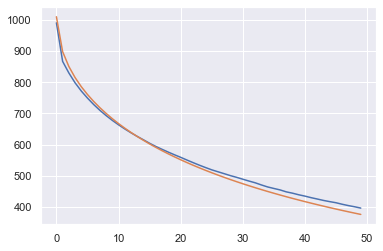

In [30]:
plt.plot(T,me)
plt.plot(T,SEM(T,params2[0],params2[1],params2[2]))

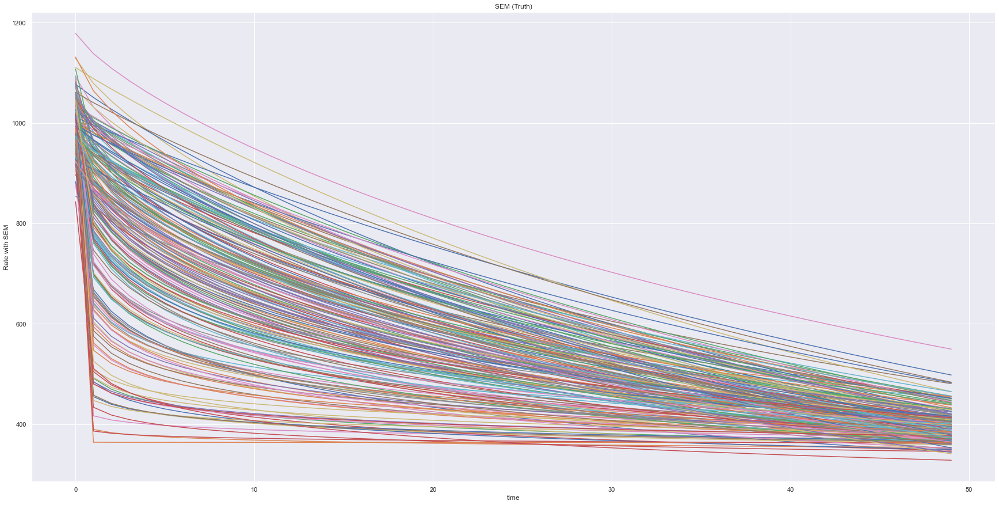

In [31]:
plt.figure(figsize=(30,15))
plt.plot(QS_DF)
plt.title('SEM (Truth)')
plt.xlabel('time')
plt.ylabel('Rate with SEM')
plt.show()

In [32]:
# SEM_T = go.Figure()
# for key, value in QS_DF.iteritems():
#     SEM_T.add_trace(go.Scatter(x=T, y=QS_DF[(key)], mode='lines', name=str(key), line=dict(color='gray')))
# SEM_T.update_layout(title={'text':'SEM Decline(True)','x':0.5,'y':0.85}, xaxis_title='Time (days)', yaxis_title='Oil Rate (bbl/day)')
# #fig_arps.update_layout(legend=dict(x=0.1,y=0.9,traceorder='normal',font=dict(size=15,)))
# SEM_T.show()

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         8.4448e+06                                    3.21e+04    
       1              2         5.5288e+06      2.92e+06       2.65e+01       1.58e+06    
       2              3         2.7711e+06      2.76e+06       3.10e+01       1.18e+06    
       3              4         1.5944e+06      1.18e+06       6.76e+00       3.46e+05    
       4              5         1.2666e+06      3.28e+05       1.81e+00       4.04e+04    
       5              6         1.2259e+06      4.07e+04       2.54e-01       7.07e+02    
       6              7         1.2252e+06      7.24e+02       5.22e-03       2.26e-01    
       7              8         1.2252e+06      2.33e-01       1.94e-06       2.35e-08    
`xtol` termination condition is satisfied.
Function evaluations 8, initial cost 8.4448e+06, final cost 1.2252e+06, first-order optimality 2.35e-08.
for exponential variogram
Q is: 1

C:\Users\siava\anaconda3\lib\site-packages\scipy\optimize\_lsq\least_squares.py:110: UserWarning: Setting `ftol` below the machine epsilon (2.22e-16) effectively disables the corresponding termination condition.
  warn("Setting `{}` below the machine epsilon ({:.2e}) effectively "


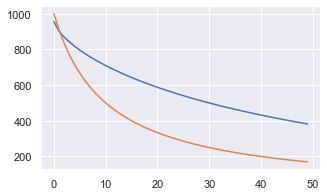

In [33]:
y=QS_DF['realization5']
T_=T
noise_sigma = T_/20
noise = np.ones((prod_time))   #np.random.randn(n) * noise_sigma
params2,cov = curve_fit(ArpsRate,T_,y/1,bounds=([900,.1,0.00001],[1000,50,.99999]),verbose=2,sigma=1/noise**2,ftol =1e-99, absolute_sigma=True)
                            # po:range ,sill ,nugget 
q = params2[0]
D = params2[1]
b = params2[2]

print('for exponential variogram')
print('Q is:',round(q,9))
print('D is:',round(D,4))
print('b:',round(b,8))
print(cov)
plt.figure(figsize=(5,3))
plt.plot(T_,y)
plt.plot(T_,ArpsRate(T,q, D,b))

In [34]:
para_mat=np.zeros((3,N))
Cov_mat=np.zeros((3,N,3))
T_=T#*100
noise_sigma = T_/20

for i,column in enumerate(QS_DF):
    noise = np.random.rand(prod_time) * noise_sigma
    noise[noise<=0]=.01
    params,cov = curve_fit(ArpsRate,T_,QS_DF[column]/1      ,maxfev =100*1000,bounds=([950,.1,0.0001],[1000,3,.99999]),ftol=1.e-16,verbose=0,sigma=1/noise**2,
                           absolute_sigma=True)
    para_mat[:,i]=params
    Cov_mat[:,i,:]=cov
    

C:\Users\siava\anaconda3\lib\site-packages\scipy\optimize\_lsq\least_squares.py:110: UserWarning: Setting `ftol` below the machine epsilon (2.22e-16) effectively disables the corresponding termination condition.
  warn("Setting `{}` below the machine epsilon ({:.2e}) effectively "


In [35]:
ARP_Mdl=np.zeros((prod_time,N))
for i in range(N):
    ARP_Mdl[:,i]=ArpsRate(T,para_mat[0,i],para_mat[1,i],para_mat[2,i])

In [36]:

# ARPS_Model = go.Figure()
# for i in range(N):
#     ARPS_Model.add_trace(go.Scatter(x=T, y=ARP_Mdl[:,i], mode='lines', name='Model'+str(i)))
# ARPS_Model.update_layout(title={'text':'Arps Model','x':0.5,'y':0.85}, xaxis_title='Time (days)', yaxis_title='Oil Rate (bbl/day)')
# #fig_arps.update_layout(legend=dict(x=0.1,y=0.9,traceorder='normal',font=dict(size=15,)))
# ARPS_Model.show()

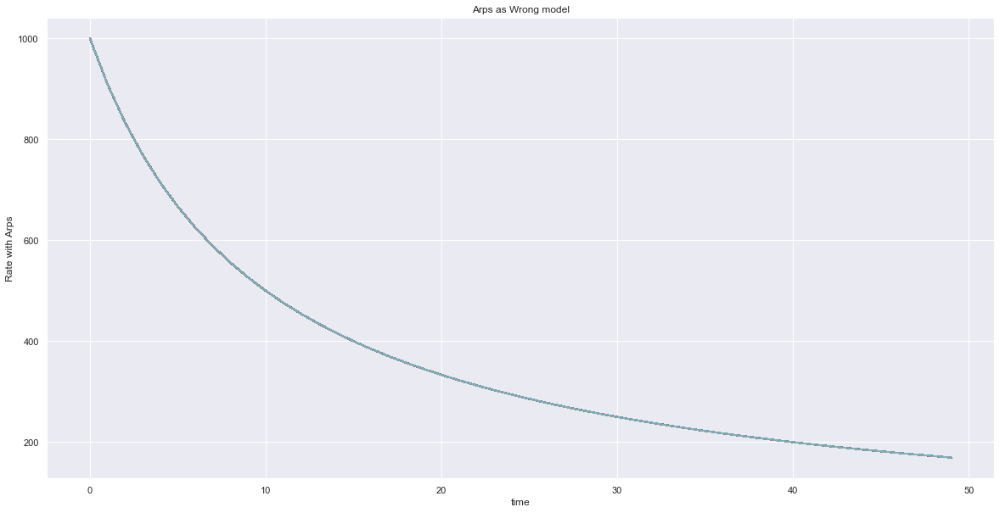

In [37]:
plt.figure(figsize=(20,10))
plt.plot(ARP_Mdl)
plt.title('Arps as Wrong model')
plt.xlabel('time')
plt.ylabel('Rate with Arps')
plt.show()

In [38]:
ARP_DF = pd.DataFrame(ARP_Mdl,columns=['realization'+str(i) for i in range(N)])

In [39]:
Mismatch = QS_DF- ARP_DF 

In [40]:
Mismatch.head(5)

,realization0,realization1,realization2,realization3,realization4,realization5,realization6,realization7,realization8,realization9,...,realization190,realization191,realization192,realization193,realization194,realization195,realization196,realization197,realization198,realization199
0,-39.463956,39.856796,-40.134307,-44.367576,-29.779873,-44.878023,-43.491783,59.167217,25.112386,61.005056,...,16.145677,-10.064720,-22.214879,9.199895,-87.661472,-21.162311,-77.245322,-28.654003,44.922261,-26.203698
1,-76.553964,-273.481207,-417.736834,-40.034014,-48.593823,-8.115385,-90.040394,-185.907651,-283.596056,1.113311,...,-252.954567,-255.611472,25.328841,-111.208361,-48.358755,-451.340264,-38.325164,-245.690848,-106.334580,3.282525
2,-44.508787,-236.168226,-363.786909,-5.741713,-17.468695,34.962527,-60.466739,-156.045823,-245.087885,28.226769,...,-219.510138,-221.327321,73.227573,-84.246562,-4.674449,-391.960815,5.755689,-213.226923,-83.803361,43.264124
3,-11.746992,-195.538561,-312.635405,26.263223,13.446110,71.997956,-29.302932,-120.747502,-203.708780,57.845824,...,-181.600993,-183.015252,113.746384,-52.751213,32.654947,-337.513188,43.552488,-176.343464,-54.923751,78.079520
4,18.073264,-157.658906,-266.957811,54.231322,41.191163,103.171437,-0.662763,-87.087376,-165.276766,85.339362,...,-145.851247,-147.023398,147.663094,-22.830504,63.979706,-289.447876,75.357800,-141.529807,-26.835436,107.506008


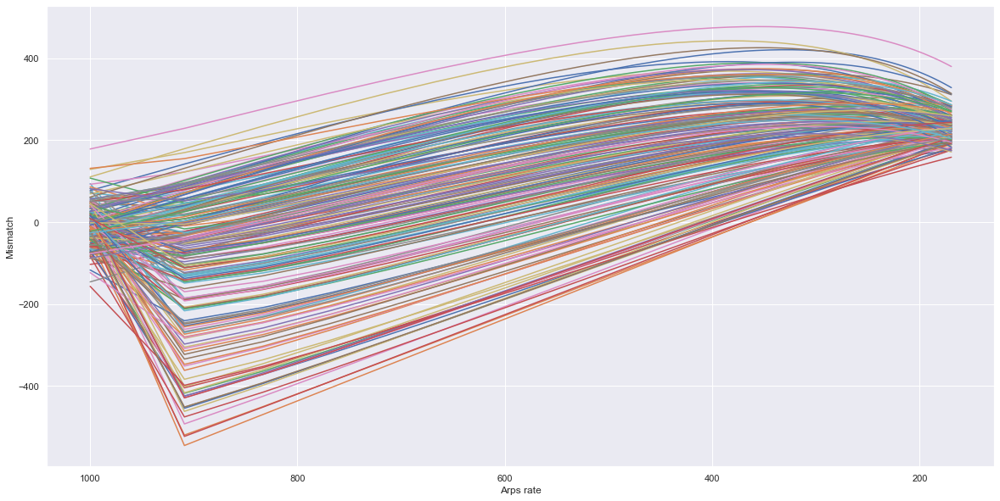

In [41]:
plt.figure(figsize=(20,10))
plt.plot(ARP_DF,Mismatch)
plt.xlabel('Arps rate')
plt.ylabel('Mismatch')
plt.gca().invert_xaxis()
plt.show()

In [42]:
def M_A(matX,matY,win_size):
    mn_range=np.min(matX); mx_range=np.max(matX)
    flt_X=matX.flatten()
    flt_Y=matY.flatten()
    save_mat=[]
    for p in flt_X:
        lstX=[]
        lstY=[]
        for j in range(len(flt_X)):
            if (flt_X[j]>= (p/2-win_size))& (flt_X[j]<=p/2+win_size):
                lstY.append(flt_Y[j])
                lstX.append(flt_X[j])
        if len(lstY)==0:
            print( "Not in range")
            return
        CrCo_M=np.corrcoef(lstX,lstY)   
        mu=np.mean(lstY)
        sd=np.std(lstY)
        PC=np.percentile(lstY,[10,50,90])
        dic={'x':p,'mean':mu, 'STD': sd, 'P10':PC[0], 'P50':PC[1], 'P90':PC[2],'Cor_Coef':CrCo_M[0,1]}
        save_mat.append(dic)    
    df= pd.DataFrame.from_dict(save_mat)
    df.sort_values(by=['x'],ascending=False, inplace=True)
    fig1 = go.Figure([
    go.Scatter(
        name='ave',
        x=df['x'],
        y=df['mean'],
        line=dict(color='rgb(0,100,80)'),
        mode='lines'
    ),
    go.Scatter(
        name='P10',
        x=df['x'], 
        y=df['P10'], 
        line=dict(color='rgba(255,255,255)'),
        
    ),
        go.Scatter(
        name='P90',   
        x=df['x'], 
        y=df['P90'], 
        line=dict(color='rgba(255,0,255)'),
        
    ),
      go.Scatter(
        name='P50' ,   
        x=df['x'], 
        y=df['P50'], 
        line=dict(color='rgba(255,255,0)'),
        
    ),
    
        go.Scatter(
        name='STD' ,   
        x=df['x'], 
        y=df['STD'],
        line=dict(color='rgba(255,255,0)'),
        
    )])
    fig1.update_layout(
    xaxis=dict(visible=True,autorange='reversed'),    
    title="",
    xaxis_title="Arps rate(model)",
    yaxis_title="Mismatch",
    legend_title="window size{}".format(win_size),
    font=dict(
        family="Courier New, monospace",
        size=12
    ))
    fig1.show() 
    fig2 = go.Figure([
    go.Scatter(
        name='Cor_Coef',
        x=df['x'],
        y=df['Cor_Coef'],
        line=dict(color='rgb(0,100,80)'),
        mode='lines'
    )])
    
    fig2.update_layout(
    xaxis=dict(visible=True,autorange='reversed'),    
    title="",
    xaxis_title="Arps rate(model)",
    yaxis_title="Correlation coefficients(Peasron) of Mismatch",
    legend_title="window size{}".format(win_size),
    font=dict(
        family="Courier New, monospace",
        size=12
    )),

    fig2.show()
    return df

In [43]:
df_out=M_A(np.array(ARP_DF),np.array(Mismatch),win_size=200)  

In [44]:
df_out

,x,mean,STD,P10,P50,P90,Cor_Coef
0,1000.000000,173.568657,132.737081,-5.826799,189.254612,332.691629,-0.389772
84,1000.000000,173.568657,132.737081,-5.826799,189.254612,332.691629,-0.389772
158,1000.000000,173.568657,132.737081,-5.826799,189.254612,332.691629,-0.389772
100,1000.000000,173.568657,132.737081,-5.826799,189.254612,332.691629,-0.389772
99,1000.000000,173.568657,132.737081,-5.826799,189.254612,332.691629,-0.389772
...,...,...,...,...,...,...,...
9968,169.489925,236.156485,54.437494,171.185074,233.391035,307.234549,0.036082
9838,169.489925,236.156485,54.437494,171.185074,233.391035,307.234549,0.036082
9853,169.489925,236.156485,54.437494,171.185074,233.391035,307.234549,0.036082
9867,169.489925,236.156485,54.437494,171.185074,233.391035,307.234549,0.036082


In [45]:
print('totlal',len(df_out))
print('more than 800is',len(df_out[df_out['x']>800]))
print('less than 300is',len(df_out[df_out['x']<300]))

totlal 10000
more than 800is 600
less than 300is 5200


In [46]:
# lst_size=np.arange(100,990,100)
# for i in lst_size:
#     M_A(np.array(ARP_DF),np.array(Mismatch),win_size=i)  

In [47]:
def M_A1(matX,matY,win_size):
    mn_range=np.min(matX); mx_range=np.max(matX)
    flt_X=matX.flatten()
    flt_Y=matY.flatten()
    
    save_mat=[]
    for p in flt_X:
        lstX=[]
        lstY=[]
        
        for j in range(len(flt_X)):
            if (flt_X[j]>= (p/2-win_size))& (flt_X[j]<=p/2+win_size):
                lstY.append(flt_Y[j])
                lstX.append(flt_X[j])
        if len(lstY)==0:
            print( "Not in range")
            return
        CrCo_M=np.corrcoef(lstX,lstY)   
        mu=np.mean(lstY)
        sd=np.std(lstY)
        PC=np.percentile(lstY,[10,50,90])
        dic={'x':p,'mean':mu, 'STD': sd, 'P10':PC[0], 'P50':PC[1], 'P90':PC[2],'Cor_Coef':CrCo_M[0,1]}
        save_mat.append(dic)
    df= pd.DataFrame.from_dict(save_mat)
    df.sort_values(by=['x'],ascending=False, inplace=True)    
    return df

# how to score ???????
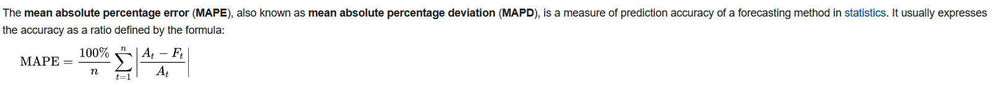

In [48]:
def MA_CV(matX,matY,win_size,K=.5):
    mn_range=np.min(matX); mx_range=np.max(matX)
    matX=matX.flatten()
    matY=matY.flatten()    
    flt_X, X_test, flt_Y, y_test = train_test_split(matX, matY, test_size=K, random_state=77)
    trn=M_A1(flt_X,flt_Y,win_size)
    tst=M_A1(X_test,y_test,win_size)
#     score=1-(trn.div(tst))
    return trn,tst

In [49]:
tr,ts=MA_CV(np.array(ARP_DF),np.array(Mismatch),win_size=500,K=.2)  

In [50]:
ARP_DF

,realization0,realization1,realization2,realization3,realization4,realization5,realization6,realization7,realization8,realization9,...,realization190,realization191,realization192,realization193,realization194,realization195,realization196,realization197,realization198,realization199
0,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,...,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
1,909.090869,909.090869,909.090869,909.090869,909.090869,909.090869,909.090869,909.090869,909.090869,909.090869,...,909.090869,909.090869,909.090869,909.090869,909.090869,909.090869,909.090869,909.090869,909.090869,909.090869
2,833.333203,833.333203,833.333203,833.333203,833.333203,833.333203,833.333203,833.333203,833.333203,833.333203,...,833.333203,833.333203,833.333203,833.333203,833.333203,833.333203,833.333203,833.333203,833.333203,833.333203
3,769.230526,769.230526,769.230526,769.230526,769.230526,769.230526,769.230526,769.230526,769.230526,769.230526,...,769.230526,769.230526,769.230526,769.230526,769.230526,769.230526,769.230526,769.230526,769.230526,769.230526
4,714.285352,714.285352,714.285352,714.285352,714.285352,714.285352,714.285352,714.285352,714.285352,714.285352,...,714.285352,714.285352,714.285352,714.285352,714.285352,714.285352,714.285352,714.285352,714.285352,714.285352
5,666.666186,666.666186,666.666186,666.666186,666.666186,666.666186,666.666186,666.666186,666.666186,666.666186,...,666.666186,666.666186,666.666186,666.666186,666.666186,666.666186,666.666186,666.666186,666.666186,666.666186
6,624.999406,624.999406,624.999406,624.999406,624.999406,624.999406,624.999406,624.999406,624.999406,624.999406,...,624.999406,624.999406,624.999406,624.999406,624.999406,624.999406,624.999406,624.999406,624.999406,624.999406
7,588.234595,588.234595,588.234595,588.234595,588.234595,588.234595,588.234595,588.234595,588.234595,588.234595,...,588.234595,588.234595,588.234595,588.234595,588.234595,588.234595,588.234595,588.234595,588.234595,588.234595
8,555.554759,555.554759,555.554759,555.554759,555.554759,555.554759,555.554759,555.554759,555.554759,555.554759,...,555.554759,555.554759,555.554759,555.554759,555.554759,555.554759,555.554759,555.554759,555.554759,555.554759
9,526.314904,526.314904,526.314904,526.314904,526.314904,526.314904,526.314904,526.314904,526.314904,526.314904,...,526.314904,526.314904,526.314904,526.314904,526.314904,526.314904,526.314904,526.314904,526.314904,526.314904


In [51]:
ts.reset_index(drop=True,inplace=True)
ts

,x,mean,STD,P10,P50,P90,Cor_Coef
0,1000.000000,179.487701,128.714810,3.452610,210.221773,304.02568,-0.63274
1,1000.000000,179.487701,128.714810,3.452610,210.221773,304.02568,-0.63274
2,1000.000000,179.487701,128.714810,3.452610,210.221773,304.02568,-0.63274
3,1000.000000,179.487701,128.714810,3.452610,210.221773,304.02568,-0.63274
4,1000.000000,179.487701,128.714810,3.452610,210.221773,304.02568,-0.63274
...,...,...,...,...,...,...,...
1995,169.489925,213.324980,88.483364,103.379932,225.106885,310.84197,-0.34638
1996,169.489925,213.324980,88.483364,103.379932,225.106885,310.84197,-0.34638
1997,169.489925,213.324980,88.483364,103.379932,225.106885,310.84197,-0.34638
1998,169.489925,213.324980,88.483364,103.379932,225.106885,310.84197,-0.34638


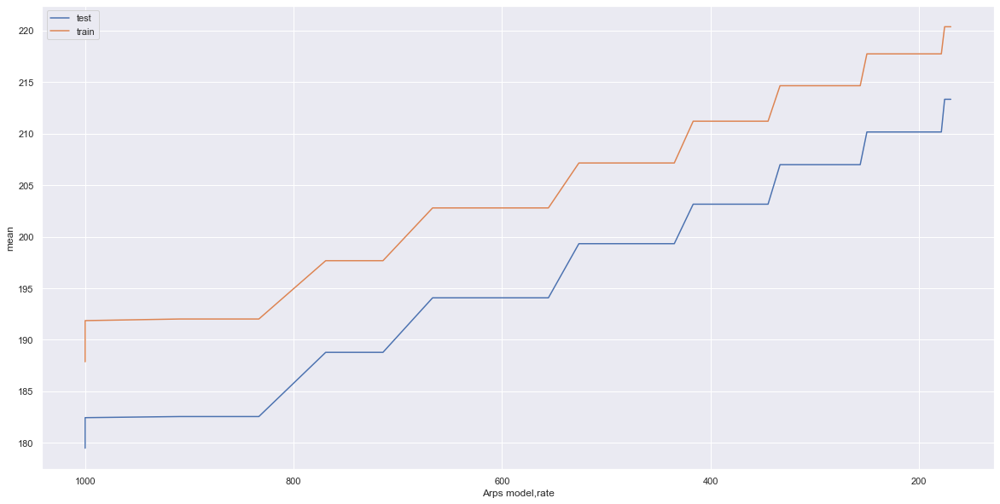

In [52]:
plt.figure(figsize=(20,10))
plt.plot(ts['x'],ts['mean'],label='test')
plt.plot(tr['x'],tr['mean'],label='train')
plt.legend()
plt.xlabel('Arps model,rate')
plt.ylabel('mean')
plt.gca().invert_xaxis()
plt.show()

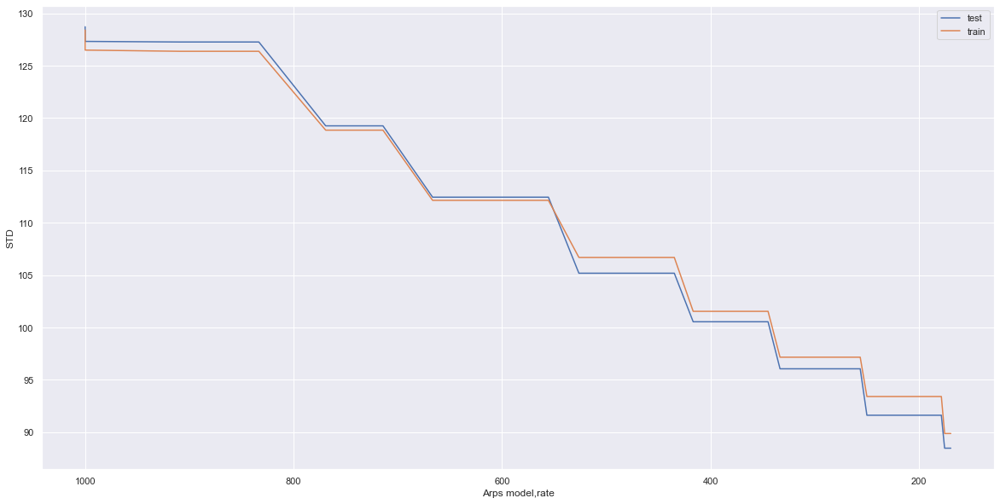

In [53]:

plt.figure(figsize=(20,10))
plt.plot(ts['x'],ts['STD'],label='test')
plt.plot(tr['x'],tr['STD'],label='train')
plt.legend()
plt.xlabel('Arps model,rate')
plt.ylabel('STD')
plt.gca().invert_xaxis()
plt.show()

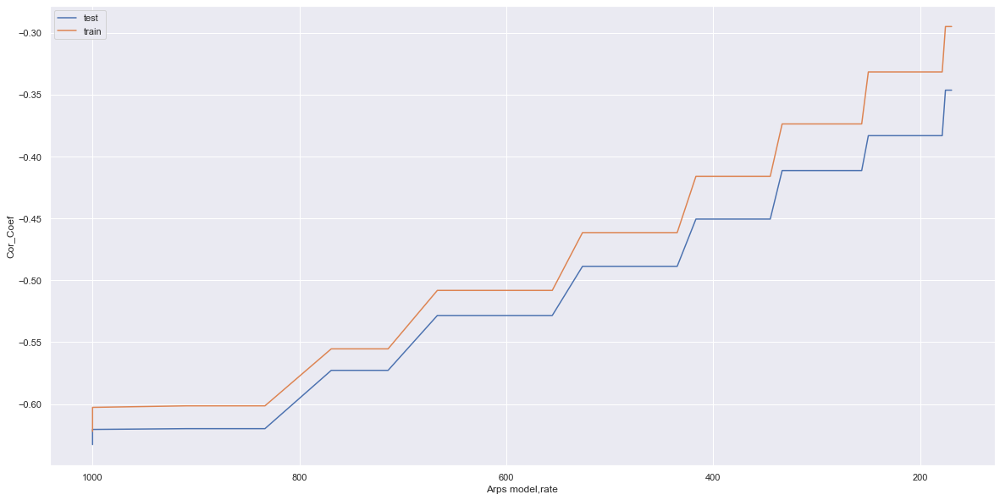

In [54]:
plt.figure(figsize=(20,10))
plt.plot(ts['x'],ts['Cor_Coef'],label='test')
plt.plot(tr['x'],tr['Cor_Coef'],label='train')
plt.legend()
plt.xlabel('Arps model,rate')
plt.ylabel('Cor_Coef')
plt.gca().invert_xaxis()
plt.show()


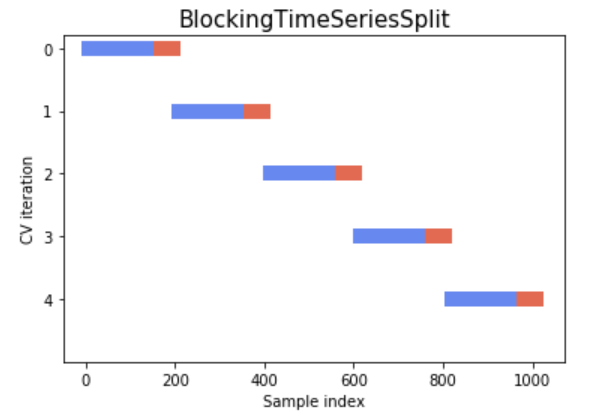

In [55]:
sft=df_out-df_out.shift(5)

In [56]:
df_out['x']

0       1000.000000
84      1000.000000
158     1000.000000
100     1000.000000
99      1000.000000
           ...     
9968     169.489925
9838     169.489925
9853     169.489925
9867     169.489925
9830     169.489925
Name: x, Length: 10000, dtype: float64

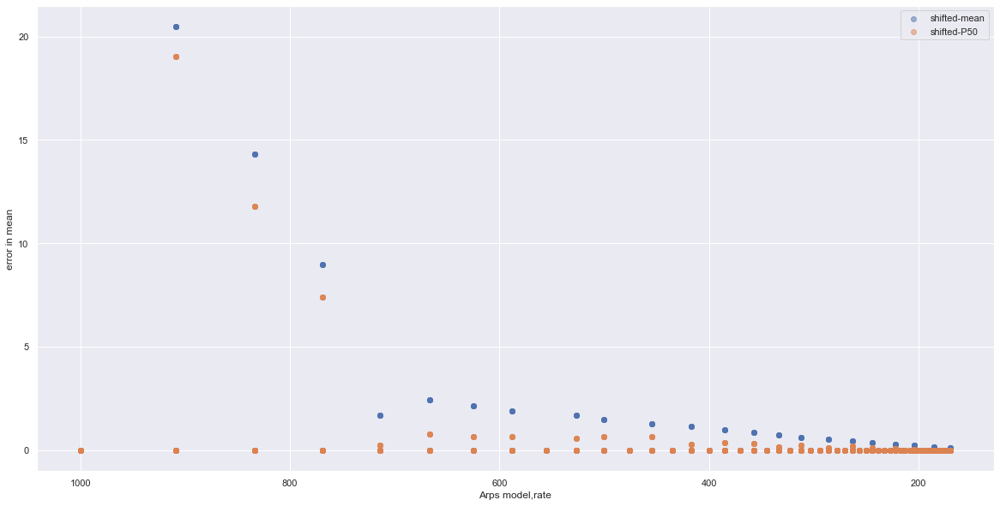

In [57]:
plt.figure(figsize=(20,10))
plt.scatter(df_out['x'],sft['mean'],label='shifted-mean',alpha=.5)
plt.scatter(df_out['x'],sft['P50'],label='shifted-P50',alpha=.5)
plt.xlabel('Arps model,rate')
plt.ylabel('error in mean')
plt.legend()
plt.gca().invert_xaxis()
plt.show()


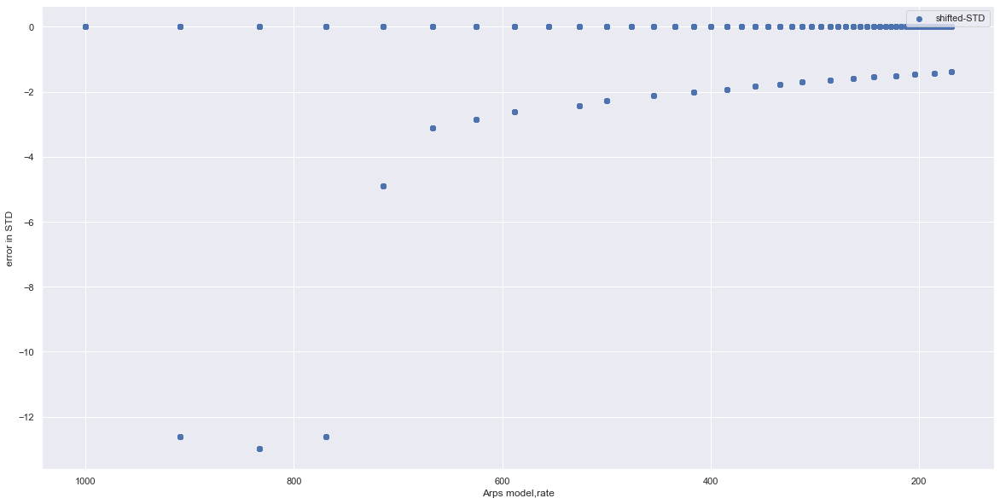

In [58]:
plt.figure(figsize=(20,10))
plt.scatter(df_out['x'],sft['STD'],label='shifted-STD')
plt.xlabel('Arps model,rate')
plt.ylabel('error in STD')
plt.legend()
plt.gca().invert_xaxis()
plt.show()

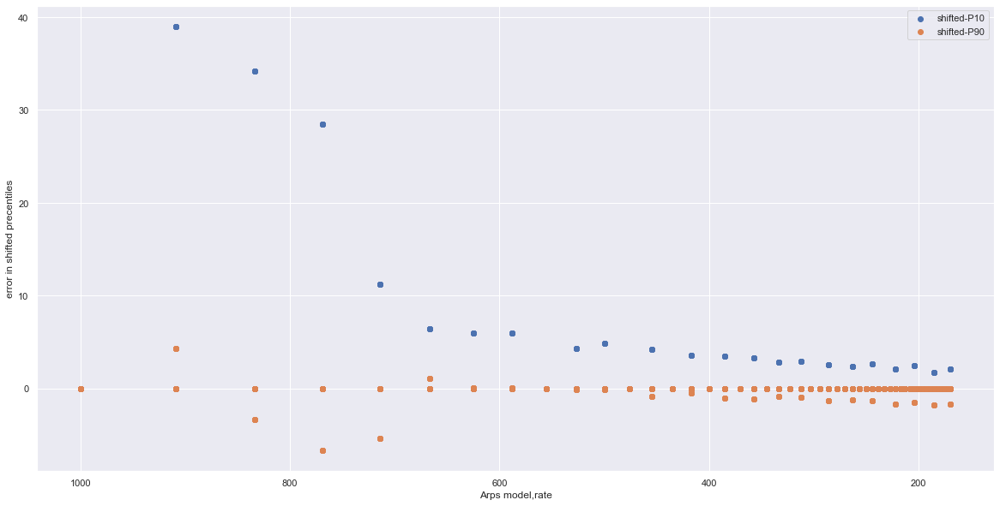

In [59]:
plt.figure(figsize=(20,10))
plt.scatter(df_out['x'],sft['P10'],label='shifted-P10')
plt.scatter(df_out['x'],sft['P90'],label='shifted-P90')
plt.xlabel('Arps model,rate')
plt.ylabel('error in shifted precentiles')
plt.legend()
plt.gca().invert_xaxis()
plt.show()

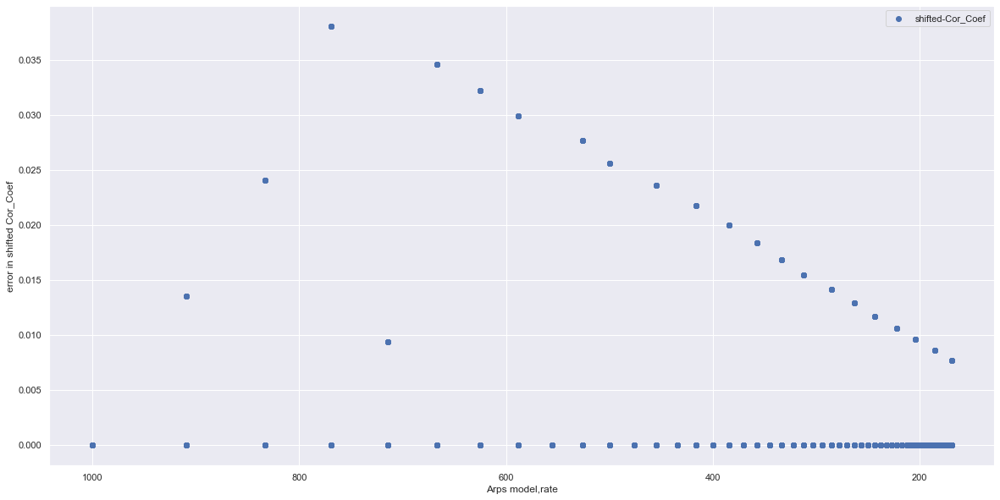

In [60]:
plt.figure(figsize=(20,10))
plt.scatter(df_out['x'],sft['Cor_Coef'],label='shifted-Cor_Coef')
plt.xlabel('Arps model,rate')
plt.ylabel('error in shifted Cor_Coef')
plt.legend()
plt.gca().invert_xaxis()
plt.show()

### Making observation with SEM Model

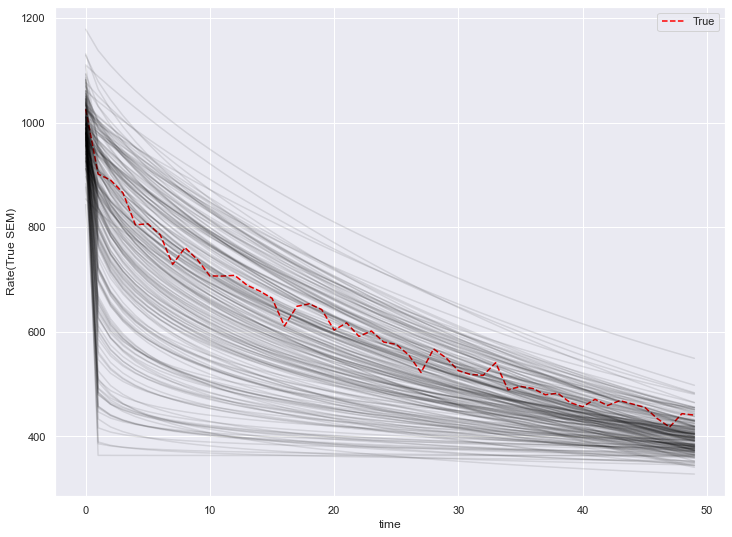

In [61]:
rnd=random.randint(0,N-1)
obs_SEM = QS_DF['realization'+str(rnd)]+ ss.norm.rvs(0,20,prod_time)
plt.figure(figsize=(12,9))
plt.plot(T,obs_SEM,label='True', color='red',linestyle='--')

plt.plot(QS_DF,alpha=.1,color='black')
plt.ylabel('Rate(True SEM)')
plt.xlabel('time')
plt.legend()
plt.show()

In [62]:
# fig_stats = go.Figure()
# fig_stats.add_trace(go.Scatter(x=T, y=Tru_SEM, mode='lines', name='Truth', line=dict(color='red')))
# fig_stats.add_trace(go.Scatter(x=np.asarray(obs_SEM)[:,0], y=np.asarray(obs_SEM)[:,1], mode='markers', name='measurment', line=dict(color='blue')))
# fig_stats.update_layout(legend=dict(x=0.8,y=0.9,traceorder='normal',font=dict(size=15,)))
# fig_stats.show()

# main ENKF

In [63]:
# def EnKF(mf_k, Xf_k, gf_k, d, par1, par2, FM,st_df=0, up_time=15, r=.5):
#     R = 0 * np.eye(up_time)
#     Yf_k_new=np.concatenate((mf_k,Xf_k,gf_k))
#     N=mf_k.shape[1]
    
#     for time in range (up_time):
#         Vk=np.random.multivariate_normal(np.zeros(up_time), np.power(R,2), N).T
#         Cd_k= 1/(N-1)* Vk @ Vk.T  #r * np.eye(2*up_time)                                   
#         obs_real= np.asmatrix(d[time])
#         dk =  np.asarray(obs_real + Vk) 
#         Yf_k = Yf_k_new
#         Pf_k = np.cov(Yf_k_new)                                                #error covariance matrix
#         H = gf_k @  sla.pinv(Yf_k)
#         Kk= (Pf_k @ H.T) @ sla.pinv(H @ Pf_k @ H.T + Cd_k)                     #Kalman gain
#         Yu_k_new = Yf_k + Kk @ (dk - H @ Yf_k)  
#         #Pu_k_new = np.cov(Yu_k_new)
#         Q0_k = Yu_k_new[0,:]
# #        m = np.vstack((x_k,D_k,b_k))
#         if FM=='Arps':
#             y=ArpsRate(np.array([range(up_time)]).T,Q0_k,par1 , par2)  #Arps(time, Q, Di0, b)
#         else:
#             y=SEM(np.array(([range(up_time)])*N).T,np.array(np.matrix(SEM_par[0,:]))[0,:],par1,par2)                            
#         Yf_k_new=np.concatenate((Q0_k,y,y))
#     return Q0_k,Yf_k_new[1:up_time+1,:]

# EnkF V2

In [64]:
# def EnKF(mf_k, Xf_k, gf_k, d, par1, par2, FM,st_df=0, up_time=15, r=.5):
#     R = r * np.eye(up_time)

#     Yf_k_new=np.concatenate((mf_k, np.asarray([par1]), np.asarray([par2]), Xf_k, gf_k))
#     N=mf_k.shape[1]
#     evolution=np.zeros((up_time,up_time,N))
#     for time in range (up_time):
#         Vk=np.random.multivariate_normal(np.zeros(up_time), R**2, N).T
#         Cd_k= 1/(N-1)* Vk @ Vk.T  #r * np.eye(2*up_time) 
#         obs_real= np.asmatrix(d[time])
#         dk =  np.asarray(obs_real + Vk) 
#         Yf_k = Yf_k_new
#         Pf_k = np.cov(Yf_k_new)                                                #error covariance matrix
#         H = gf_k @  sla.pinv(Yf_k)
#         Kk= (Pf_k @ H.T) @ sla.pinv(H @ Pf_k @ H.T + Cd_k)                     #Kalman gain
#         print('d',dk)
#         print('obs_real',obs_real)
#         Yu_k_new = Yf_k + Kk @ (dk - H @ Yf_k)  
#         #Pu_k_new = np.cov(Yu_k_new)
#         Q0_k = Yu_k_new[0,:]
# #         print('q0',Yu_k_new[0,:])
# #         print('d',Yu_k_new[1,:])
# #         print('b',Yu_k_new[2,:])
# #        m = np.vstack((x_k,D_k,b_k))
#         if FM=='Arps':
#             y=ArpsRate(np.array([range(up_time)]).T,Q0_k,par1 , par2)          #Arps(time, Q, Di0, b)
#         else:
#             y=SEM(np.array(([range(up_time)])*N).T,np.array(np.matrix(SEM_par[0,:]))[0,:],par1,par2)                            
#         Yf_k_new=np.concatenate((mf_k, np.asarray([par1]), np.asarray([par2]),y,y))
#         evolution[time,:,:]=Yf_k_new[3:up_time+3,:]
#     return Q0_k,Yf_k_new[3:up_time+3,:],evolution

# EnKF V3

In [65]:
def EnKF(mf_k,Xf_k, gf_k, d, par1, par2, FM,st_df=0, r=.5):
    R = r + np.eye(1)
    N=mf_k.shape[1]
    nmeas=(obs_SEM).shape[0]
    Y_f_ = np.zeros([5,N,nmeas+1])
    P_f_ = np.zeros([5,5,nmeas+1])
    Y_a_ = np.zeros([5,N,nmeas+1])
    P_a_ = np.zeros([5,5,nmeas+1])
    Y_f_[0,:,0] = mf_k
    Y_f_[3,:,0] = mf_k
    Y_f_[4,:,0] = mf_k
    Y_f_[1,:,0] = par1; Y_f_[2,:,0] = par2
    P_f_[:,:,0] = np.cov(Y_f_[:,:,0])
    Y_a_[0,:,0] = mf_k
    Y_a_[3,:,0] = mf_k
    Y_a_[4,:,0] = mf_k
    Y_a_[1,:,0] = par1; Y_a_[2,:,0] = par2
    P_a_[:,:,0] = np.cov(Y_a_[:,:,0])
    for t in range(nmeas):
        # forecast step
        Q0 = Y_a_[0,:,t]
        lnq_a_before_ens = Y_a_[3,:,t]
        # forecasting
        if FM=='Arps':
            Qt=ArpsRate(np.array([range(t+1)]).T, Q0 ,par1 , par2)          #Arps(time, Q, Di0, b)
        else:
            Qt=SEM(np.array(([range(t+1)])*N).T, Q0 ,par1,par2)  #SEM(time, Q, Tau, n)

        #### recheck this part
        Y_f_[0,:,t+1] = Q0
        Y_f_[3,:,t+1] = Qt[t,:]
        Y_f_[4,:,t+1] = Qt[t,:]
        Y_f_[1,:,t+1] = par1;Y_f_[2,:,t+1] = par2   
        Y_f_now = Y_f_[:,:,t+1]
        P_f_now = np.cov(Y_f_now)*N/np.sqrt(N-1)
        P_f_[:,:,t+1] = P_f_now
        # analysis step
        H = np.array([Qt[t,:] @  sla.pinv(Y_f_now)])   
        K = P_f_now @ H.T @ sla.pinv(H @ P_f_now @ H.T + R)
        y = d[t] + ss.norm.rvs(0,r,1) # measurement + noise
        Y_a_now = Y_f_now + K @ (y - H @ Y_f_now)
        P_a_now = np.cov(Y_a_now)
        # store the results
        Y_a_[:,:,t+1] = Y_a_now
        P_a_[:,:,t+1] = P_a_now
        
    return Y_a_

check to see if along Q0 import parameters as stat vector but do not update them first try>

Also see if u can save each itreation output

Try to see if you can use q at next time of production maybe the error is there bc even after all Q0 is same as input...

In [82]:
Arps_updated= EnKF(mf_k=np.matrix(para_mat[0,:]),                      #state_variables,, 
                    Xf_k=np.array(ARP_DF),                            #dynamic_reservoir_model
                    gf_k=np.array(ARP_DF),                           #observation_current
                    d=np.asarray(obs_SEM),                     #measurements
                    par1=(para_mat[1,:]),                             #paramter1
                    par2=(para_mat[2,:]),                             #parameter2                                                    
                    r=10,                                            # R
                    FM='Arps',                                        #forward model
                    st_df= df_out                                     #statistical data
                   )

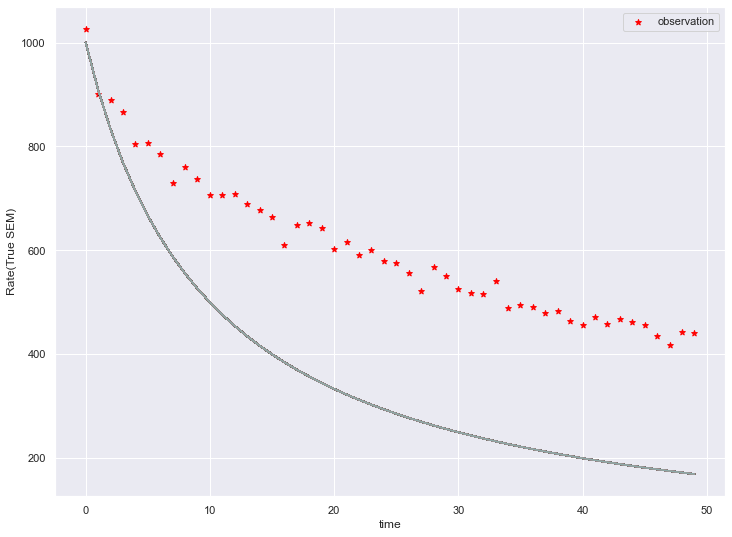

In [83]:
plt.figure(figsize=(12,9))
plt.scatter(T,np.asarray(obs_SEM),color='red',marker='*',label='observation')
plt.plot(T,ARP_DF,alpha=.5)
plt.ylabel('Rate(True SEM)')
plt.xlabel('time')
plt.legend()
plt.show()

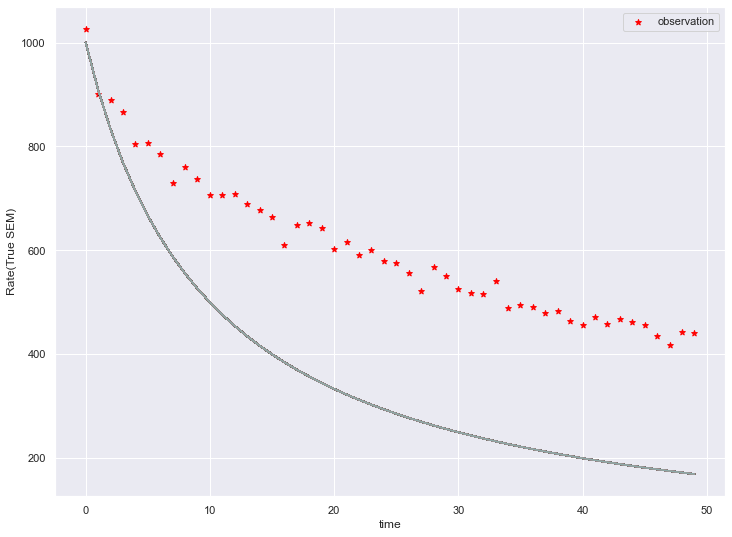

In [84]:
plt.figure(figsize=(12,9))
plt.scatter(T,np.asarray(obs_SEM),color='red',marker='*',label='observation')
plt.plot(T,Arps_updated[4,:,1:].T,alpha=.5)
plt.ylabel('Rate(True SEM)')
plt.xlabel('time')
plt.legend()
plt.show()

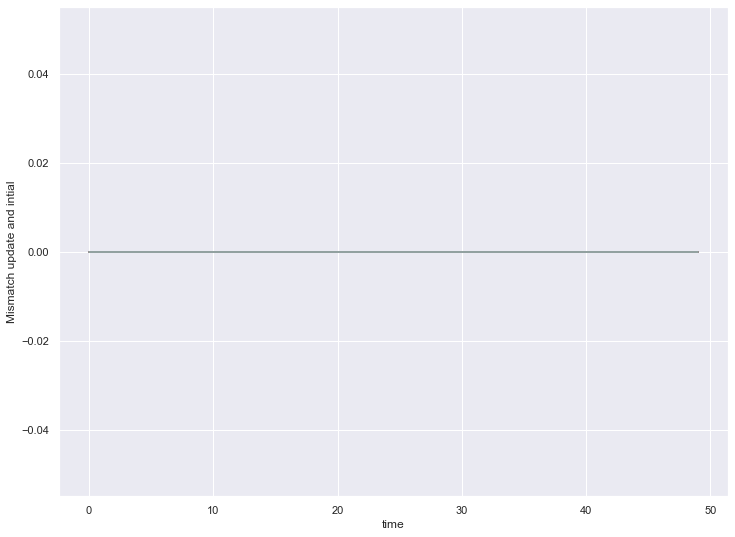

In [85]:
plt.figure(figsize=(12,9))

plt.plot(T,ARP_DF-Arps_updated[4,:,1:].T,alpha=.5)
plt.ylabel('magnitude of update')
plt.xlabel('time')

plt.show()

In [71]:
SEM_update= EnKF(mf_k=np.matrix(SEM_par[0,:]),                      #state_variables,, 
                    Xf_k=np.array(QS_DF),                            #dynamic_reservoir_model
                    gf_k=np.array(QS_DF),                           #observation_current
                    d=np.asarray(obs_SEM).T,                     #measurements
                    par1=(SEM_par[1,:]),
                    par2=(SEM_par[2,:]),
                    r=10,
                    FM='SEM')

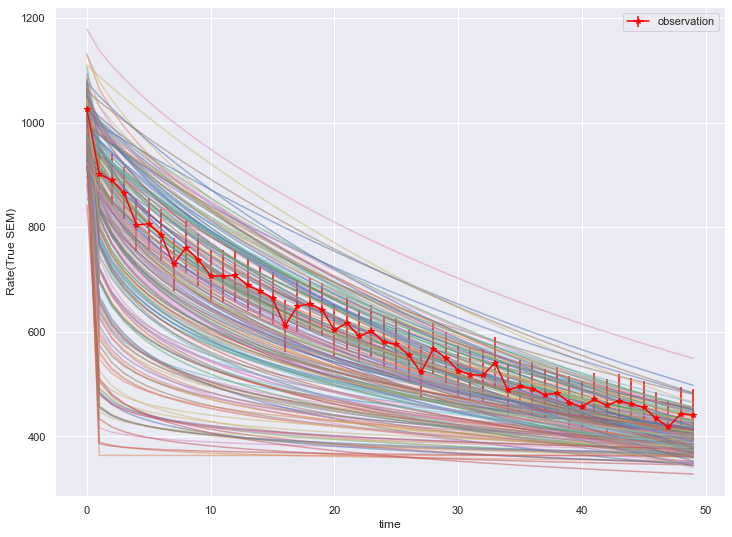

In [72]:
plt.figure(figsize=(12,9))
plt.errorbar(T,np.asarray(obs_SEM),xerr = 0.1, yerr = 50,color='red',marker='*',label='observation')
plt.plot(T,QS_DF,alpha=.5)
plt.ylabel('Rate(True SEM)')
plt.xlabel('time')
plt.legend()
plt.show()

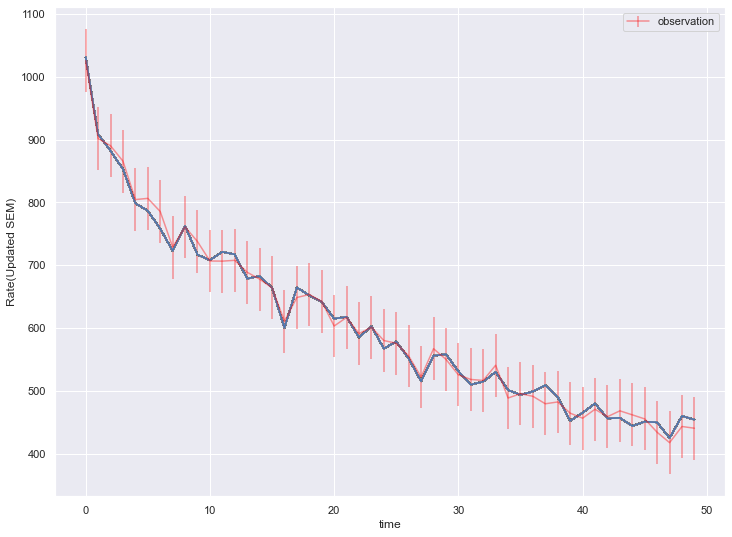

In [94]:
plt.figure(figsize=(12,9))
plt.errorbar(T,np.asarray(obs_SEM), yerr = 50,color='red',label='observation',alpha=.4)
plt.plot(T,(SEM_update[4,:,1:]).T,alpha=.4)
plt.ylabel('Rate(Updated SEM)')
plt.xlabel('time')
plt.legend()
plt.show()

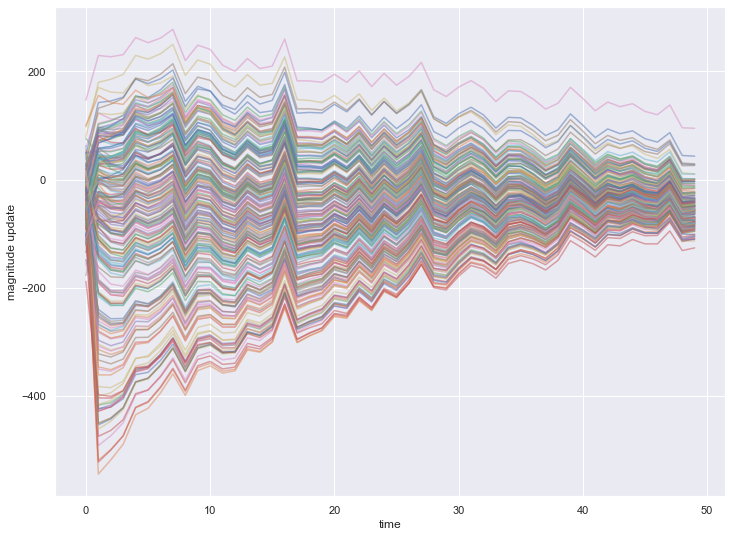

In [89]:
plt.figure(figsize=(12,9))

plt.plot(T,QS_DF-SEM_update[4,:,1:].T,alpha=.5)
plt.ylabel('magnitude update')
plt.xlabel('time')

plt.show()

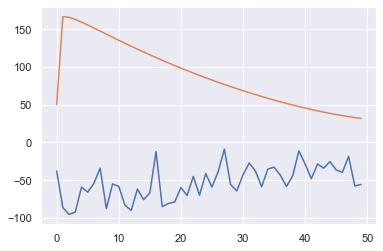

In [97]:
plt.plot((QS_DF-SEM_update[4,:,1:].T).mean(axis=1))
plt.plot((QS_DF-SEM_update[4,:,1:].T).std(axis=1))

In [75]:
ssdd=df_out.sort_values(by=['x'], axis=0, ascending=True, inplace=False)

In [76]:
np.interp(35.482671,ssdd['x'],ssdd['mean']),np.interp(35.482671,ssdd['x'],ssdd['STD'])

(236.1564851410327, 54.437493598014406)

In [77]:
df_out

,x,mean,STD,P10,P50,P90,Cor_Coef
0,1000.000000,173.568657,132.737081,-5.826799,189.254612,332.691629,-0.389772
84,1000.000000,173.568657,132.737081,-5.826799,189.254612,332.691629,-0.389772
158,1000.000000,173.568657,132.737081,-5.826799,189.254612,332.691629,-0.389772
100,1000.000000,173.568657,132.737081,-5.826799,189.254612,332.691629,-0.389772
99,1000.000000,173.568657,132.737081,-5.826799,189.254612,332.691629,-0.389772
...,...,...,...,...,...,...,...
9968,169.489925,236.156485,54.437494,171.185074,233.391035,307.234549,0.036082
9838,169.489925,236.156485,54.437494,171.185074,233.391035,307.234549,0.036082
9853,169.489925,236.156485,54.437494,171.185074,233.391035,307.234549,0.036082
9867,169.489925,236.156485,54.437494,171.185074,233.391035,307.234549,0.036082


In [78]:
# ssdd=df_out.sort_values(by=['x'], axis=0, ascending=True, inplace=False)

In [79]:
# N = 80 # No.Realization
# n=50 #times
# Q_SEM = np.zeros((n,N))
# SEM_par=np.zeros((3,N))
# for i in range(N):
#     Tau_sample = uniform_samples(20,30,1)
#     n_sample = uniform_samples(0.0001,1,1)
#     T = np.arange(0,n)
# #     Q1=np.linspace(0,1000,n)[::-1]     #Also can chane it in a way to make different Qini Q fin)
#     Q1=Normal_samples(1000,50, 1)
#     Q_SEM[:,i]=SEM(T,Q1,Tau_sample,n_sample)
#     SEM_par[0,i]=Q1[0]
#     SEM_par[1,i]=Tau_sample
#     SEM_par[2,i]=n_sample
# QS_DF=pd.DataFrame(Q_SEM,columns=['realization'+str(i) for i in range(N)])

In [80]:
# QS_DF.plot()